In [1]:
# Imports
import pandas as pd
import numpy as np
from pathlib import Path
import hvplot.pandas
import matplotlib.pyplot as plt
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from pandas.tseries.offsets import DateOffset
from sklearn.metrics import classification_report
import yfinance as yf
from finta import TA
from keras.models import Sequential
from keras.layers import Dense, Activation
from sklearn.ensemble import RandomForestClassifier

2022-12-02 15:37:51.072789: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# Download data for BTC

ticker = "BTC-USD"

btc_df = yf.download(ticker, period='2y',  index = "Date", interval = "1h")

btc_df.head()

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
2020-12-02 05:00:00,18514.736328,18662.427734,18498.080078,18641.208984,18641.208984,0
2020-12-02 06:00:00,18648.583984,18890.400391,18648.583984,18890.400391,18890.400391,860889088
2020-12-02 07:00:00,18892.275391,19072.173828,18871.671875,19072.173828,19072.173828,0
2020-12-02 08:00:00,19084.359375,19308.330078,19080.830078,19178.357422,19178.357422,1779945472
2020-12-02 09:00:00,19187.232422,19284.236328,19073.878906,19083.203125,19083.203125,362713088


### Add hourly returns column

In [3]:
# Calculate the hourly returns using the closing prices and the pct_change function
btc_df["actual_returns"] = btc_df["Close"].pct_change()

# Drop all NaN values from the DataFrame
btc_df = btc_df.dropna()

# Review the DataFrame
display(btc_df.head())
display(btc_df.tail())

,Open,High,Low,Close,Adj Close,Volume,actual_returns
2020-12-02 06:00:00,18648.583984,18890.400391,18648.583984,18890.400391,18890.400391,860889088,0.013368
2020-12-02 07:00:00,18892.275391,19072.173828,18871.671875,19072.173828,19072.173828,0,0.009623
2020-12-02 08:00:00,19084.359375,19308.330078,19080.830078,19178.357422,19178.357422,1779945472,0.005567
2020-12-02 09:00:00,19187.232422,19284.236328,19073.878906,19083.203125,19083.203125,362713088,-0.004962
2020-12-02 10:00:00,19070.074219,19173.886719,19032.341797,19093.304688,19093.304688,0,0.000529


,Open,High,Low,Close,Adj Close,Volume,actual_returns
2022-12-02 02:00:00,16934.167969,16937.792969,16891.224609,16914.031250,16914.031250,271276032,-1.078975e-03
2022-12-02 03:00:00,16917.830078,16932.234375,16902.998047,16905.181641,16905.181641,98840576,-5.232111e-04
2022-12-02 04:00:00,16902.996094,16937.691406,16896.234375,16937.691406,16937.691406,158128128,1.923065e-03
2022-12-02 05:00:00,16937.675781,16937.675781,16935.744141,16935.744141,16935.744141,11075584,-1.149664e-04
2022-12-02 05:06:00,16935.751953,16935.751953,16935.751953,16935.751953,16935.751953,0,4.613024e-07


### Generating trading indicators for potential use for the trading algorithm - EMA

In [4]:
# create dataframe with index & close column
ema_signals_df = btc_df.loc[:, ["Close"]].copy()

# Set the short window, middle and long windows
short_window = 10
middle_window = 40
long_window = 90

# Create a short window EMA
ema_signals_df["EMA50"] = ema_signals_df["Close"].rolling(window=short_window).mean()

# Create a middle window EMA
ema_signals_df["EMA100"] = ema_signals_df["Close"].rolling(window=middle_window).mean()

# Create a short window EMA
ema_signals_df["EMA200"] = ema_signals_df["Close"].ewm(span=long_window).mean()

# Review the DataFrame
ema_signals_df

,Close,EMA50,EMA100,EMA200
2020-12-02 06:00:00,18890.400391,NaN,NaN,18890.400391
2020-12-02 07:00:00,19072.173828,NaN,NaN,18982.296962
2020-12-02 08:00:00,19178.357422,NaN,NaN,19049.108067
2020-12-02 09:00:00,19083.203125,NaN,NaN,19057.918038
2020-12-02 10:00:00,19093.304688,NaN,NaN,19065.313371
...,...,...,...,...
2022-12-02 02:00:00,16914.031250,16953.370312,17015.275684,16809.015327
2022-12-02 03:00:00,16905.181641,16945.066992,17015.727490,16811.128873
2022-12-02 04:00:00,16937.691406,16944.904297,17018.317285,16813.910467
2022-12-02 05:00:00,16935.744141,16943.279883,17021.320459,16816.588130


In [5]:
# Visualize close price for the investment
price_close = ema_signals_df[["Close"]].hvplot(
    line_color='lightgray',
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize moving averages
moving_avgs = ema_signals_df[["EMA50", "EMA100", "EMA200"]].hvplot(
    ylabel='Price in $',
    width=1000,
    height=400
)

# Overlay plots
ema_plot = price_close * moving_avgs
ema_plot

:Overlay
   .Curve.I     :Curve   [index]   (Close)
   .NdOverlay.I :NdOverlay   [Variable]
      :Curve   [index]   (value)

In [6]:
# Set the Signal column
ema_signals_df["Signal 50/100"] = 0.0
ema_signals_df["Signal 50/200"] = 0.0
ema_signals_df["Signal 100/200"] = 0.0
# Generate the trading signal 1 or 0,
# where 1 is when the EMA50 is greater than (or crosses over) the EMA100
# where 0 is when the EMA50 is under the EMA100
ema_signals_df["Signal 50/100"][short_window:] = np.where(
    ema_signals_df["EMA50"][short_window:] > ema_signals_df["EMA100"][short_window:], 1.0, 0.0
)

# where 1 is when the EMA50 is greater than (or crosses over) the EMA200
# where 0 is when the EMA50 is under the EMA200
ema_signals_df["Signal 50/200"][short_window:] = np.where(
    ema_signals_df["EMA50"][short_window:] > ema_signals_df["EMA200"][short_window:], 1.0, 0.0
)

# where 1 is when the EMA100 is greater than (or crosses over) the EMA200
# where 0 is when the EMA100 is under the EMA200
ema_signals_df["Signal 100/200"][short_window:] = np.where(
    ema_signals_df["EMA100"][short_window:] > ema_signals_df["EMA200"][short_window:], 1.0, 0.0
)

# Calculate the points in time at which a position should be taken, 1 or -1
ema_signals_df["Entry/Exit"] = (ema_signals_df["Signal 50/100"] + ema_signals_df["Signal 50/200"]+ema_signals_df["Signal 100/200"]).diff()

# Review the DataFrame
ema_signals_df.head()

,Close,EMA50,EMA100,EMA200,Signal 50/100,Signal 50/200,Signal 100/200,Entry/Exit
2020-12-02 06:00:00,18890.400391,NaN,NaN,18890.400391,0.0,0.0,0.0,NaN
2020-12-02 07:00:00,19072.173828,NaN,NaN,18982.296962,0.0,0.0,0.0,0.0
2020-12-02 08:00:00,19178.357422,NaN,NaN,19049.108067,0.0,0.0,0.0,0.0
2020-12-02 09:00:00,19083.203125,NaN,NaN,19057.918038,0.0,0.0,0.0,0.0
2020-12-02 10:00:00,19093.304688,NaN,NaN,19065.313371,0.0,0.0,0.0,0.0


In [7]:
# Visualize entry position relative to close price
entry = ema_signals_df[ema_signals_df["Entry/Exit"] == 1.0]["Close"].hvplot.scatter(
    color='purple',
    marker='^',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize exit position relative to close price
exit = ema_signals_df[ema_signals_df["Entry/Exit"] == -1.0]["Close"].hvplot.scatter(
    color='orange',
    marker='v',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize close price for the investment
security_close = ema_signals_df[["Close"]].hvplot(
    line_color='lightgray',
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize moving averages
moving_avgs = ema_signals_df[["EMA50", "EMA100", "EMA200"]].hvplot(
    ylabel='Price in $',
    width=1000,
    height=400
)

# Overlay plots
entry_exit_plot =  price_close * moving_avgs * entry * exit
entry_exit_plot

:Overlay
   .Curve.I          :Curve   [index]   (Close)
   .NdOverlay.I      :NdOverlay   [Variable]
      :Curve   [index]   (value)
   .Scatter.Close.I  :Scatter   [index]   (Close)
   .Scatter.Close.II :Scatter   [index]   (Close)

In [8]:
# Set initial capital
initial_capital = float(100000)

# Set the coin size
position_size = 1

### Testing 3EMA indicators

In [9]:
# add total signals column to signals_df

cols = ["Signal 50/100", "Signal 50/200", "Signal 100/200"]

ema_signals_df["Total Signals"] = ema_signals_df[cols].sum(axis=1)

In [10]:
# Buy a 1 coin position when the dual ema crossover Signal equals 1
# Otherwise, `Position` should be zero (sell)
ema_signals_df['Position'] = position_size * ema_signals_df['Total Signals']

In [11]:
# Determine the points in time where a 500 coin position is bought or sold
ema_signals_df['Entry/Exit Position'] = ema_signals_df['Position'].diff()

In [12]:
# Multiply the close price by the number of coins held, or the Position
ema_signals_df['Portfolio Holdings'] = ema_signals_df['Close'] * ema_signals_df['Position']

In [13]:
# Subtract the amount of either the cost or proceeds of the trade from the initial capital invested
ema_signals_df['Portfolio Cash'] = initial_capital - (ema_signals_df['Close'] * ema_signals_df['Entry/Exit Position']).cumsum() 

In [14]:
# Calculate the total portfolio value by adding the portfolio cash to the portfolio holdings (or investments)
ema_signals_df['Portfolio Total'] = ema_signals_df['Portfolio Cash'] + ema_signals_df['Portfolio Holdings']

In [15]:
# Calculate the portfolio daily returns
ema_signals_df['Portfolio Daily Returns'] = ema_signals_df['Portfolio Total'].pct_change()

In [16]:
# Calculate the portfolio cumulative returns
ema_signals_df['Portfolio Cumulative Returns'] = (1 + ema_signals_df['Portfolio Daily Returns']).cumprod() - 1

In [17]:
# Visualize exit position relative to total portfolio value
ema_exit = ema_signals_df[ema_signals_df['Entry/Exit'] == -1.0]['Portfolio Total'].hvplot.scatter(
    color='yellow',
    marker='v',
    legend=False,
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize entry position relative to total portfolio value
ema_entry = ema_signals_df[ema_signals_df['Entry/Exit'] == 1.0]['Portfolio Total'].hvplot.scatter(
    color='purple',
    marker='^',
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize the value of the total portfolio
ema_total_portfolio_value = ema_signals_df[['Portfolio Total']].hvplot(
    line_color='lightgray',
    ylabel='Total Portfolio Value',
    xlabel='Date',
    width=1000,
    height=400
)

# Overlay the plots
ema_portfolio_entry_exit_plot = ema_total_portfolio_value * ema_entry * ema_exit
ema_portfolio_entry_exit_plot.opts(
    title="BTC Algorithm - Total Portfolio Value Using EMA Stategy",
    yformatter='%.0f'
)

:Overlay
   .Curve.I                    :Curve   [index]   (Portfolio Total)
   .Scatter.Portfolio_Total.I  :Scatter   [index]   (Portfolio Total)
   .Scatter.Portfolio_Total.II :Scatter   [index]   (Portfolio Total)

In [18]:
# Reviewing the portfolio cumulative returns
ending_portfolio_value = ema_signals_df["Portfolio Total"].iloc[-1]
total_return_dollar = round(ending_portfolio_value - initial_capital, 2)
total_return_percent = round((total_return_dollar/initial_capital)*100,2)
buy_hold_value = (initial_capital/ema_signals_df["Close"].iloc[1] * ema_signals_df["Close"].iloc[-1])

In [19]:
# Statements for the overall return of the algorithm vs buying & hold.

print(f"Starting with a ${initial_capital} investment and using a {position_size} coin position size, the overall return of this algorithm is ${total_return_dollar} or {total_return_percent}%.")
print(f"In comparison, buying and holding ${initial_capital} worth of BTC over the same time period would end up with a return of ${round(buy_hold_value - initial_capital,2)} or {round((buy_hold_value - initial_capital)/initial_capital*100,2)}%.")

Starting with a $100000.0 investment and using a 1 coin position size, the overall return of this algorithm is $4439.57 or 4.44%.
In comparison, buying and holding $100000.0 worth of BTC over the same time period would end up with a return of $-11201.77 or -11.2%.


### Generating trading indicators for potential use for the trading algorithm - Relative Strength Index

In [20]:
# Generate RSI
btc_rsi = TA.RSI(btc_df)  
# Join RSI with the original dataframe.
btc_df = pd.concat([btc_df, btc_rsi], axis = 1)
btc_df

,Open,High,Low,Close,Adj Close,Volume,actual_returns,14 period RSI
2020-12-02 06:00:00,18648.583984,18890.400391,18648.583984,18890.400391,18890.400391,860889088,1.336777e-02,NaN
2020-12-02 07:00:00,18892.275391,19072.173828,18871.671875,19072.173828,19072.173828,0,9.622530e-03,100.000000
2020-12-02 08:00:00,19084.359375,19308.330078,19080.830078,19178.357422,19178.357422,1779945472,5.567462e-03,100.000000
2020-12-02 09:00:00,19187.232422,19284.236328,19073.878906,19083.203125,19083.203125,362713088,-4.961546e-03,72.850801
2020-12-02 10:00:00,19070.074219,19173.886719,19032.341797,19093.304688,19093.304688,0,5.293431e-04,73.668105
...,...,...,...,...,...,...,...,...
2022-12-02 02:00:00,16934.167969,16937.792969,16891.224609,16914.031250,16914.031250,271276032,-1.078975e-03,41.201776
2022-12-02 03:00:00,16917.830078,16932.234375,16902.998047,16905.181641,16905.181641,98840576,-5.232111e-04,40.346981
2022-12-02 04:00:00,16902.996094,16937.691406,16896.234375,16937.691406,16937.691406,158128128,1.923065e-03,44.871734
2022-12-02 05:00:00,16937.675781,16937.675781,16935.744141,16935.744141,16935.744141,11075584,-1.149664e-04,44.653254


In [21]:
# create dataframe for RSI signals
rsi_signals_df = pd.DataFrame()
rsi_signals_df["Close"] = btc_df["Close"]

In [22]:
# Create a trading algorithm using RSI
# Set the Signal column
rsi_signals_df["Signal"] = 0.0

# Generate the trading signals 1 (entry) or -1 (exit) for a long position trading algorithm
# where 1 is when the RSI is equal to or under 25.
# where -1 is when the the RSI is equal to or greater than 80.
for index, row in btc_df.iterrows():
    if row["14 period RSI"] <= 25:
        rsi_signals_df.loc[index, "Signal"] = 1.0
    if row["14 period RSI"] >= 80:
        rsi_signals_df.loc[index,"Signal"] = -1.0

rsi_signals_df["Signal"] = rsi_signals_df["Signal"]
rsi_signals_df["Entry/Exit"] = rsi_signals_df["Signal"].diff()        
        
# Review the DataFrame
rsi_signals_df.head(10)

,Close,Signal,Entry/Exit
2020-12-02 06:00:00,18890.400391,0.0,NaN
2020-12-02 07:00:00,19072.173828,-1.0,-1.0
2020-12-02 08:00:00,19178.357422,-1.0,0.0
2020-12-02 09:00:00,19083.203125,0.0,1.0
2020-12-02 10:00:00,19093.304688,0.0,0.0
2020-12-02 11:00:00,19104.140625,0.0,0.0
2020-12-02 12:00:00,18927.316406,0.0,0.0
2020-12-02 13:00:00,19127.753906,0.0,0.0
2020-12-02 14:00:00,18958.345703,0.0,0.0
2020-12-02 15:00:00,18893.449219,0.0,0.0


In [23]:
# Visualize entry position relative to close price
entry = rsi_signals_df[rsi_signals_df["Entry/Exit"] == 1.0]["Close"].hvplot.scatter(
    color='green',
    marker='^',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize exit position relative to close price
exit = rsi_signals_df[rsi_signals_df["Entry/Exit"] == -1.0]["Close"].hvplot.scatter(
    color='red',
    marker='v',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)
# Visualize close price for the investment
btc_close = rsi_signals_df[["Close"]].hvplot(
    line_color='lightgray',
    ylabel='Price in $',
    width=1000,
    height=400
)


# Overlay plots
rsi_plot = btc_close * entry * exit
rsi_plot

:Overlay
   .Curve.I          :Curve   [index]   (Close)
   .Scatter.Close.I  :Scatter   [index]   (Close)
   .Scatter.Close.II :Scatter   [index]   (Close)

### Testing RSI indicators

In [24]:
# Buy a 1 coin position when the RSI is <= 25
# Otherwise, `Position` should be zero (sell)
rsi_signals_df['Position'] = position_size * rsi_signals_df['Signal']

In [25]:
# Determine the points in time where a 1 coin position is bought or sold
rsi_signals_df['Entry/Exit Position'] = rsi_signals_df['Position'].diff()

In [26]:
# Multiply the close price by the number of coins held
rsi_signals_df['Portfolio Holdings'] = rsi_signals_df['Close'] * rsi_signals_df['Position']

In [27]:
# Subtract the amount of either the cost or proceeds of the trade from the initial capital invested
rsi_signals_df['Portfolio Cash'] = initial_capital - (rsi_signals_df['Close'] * rsi_signals_df['Entry/Exit Position']).cumsum() 

In [28]:
# Calculate the total portfolio value by adding the portfolio cash to the portfolio holdings (or investments)
rsi_signals_df['Portfolio Total'] = rsi_signals_df['Portfolio Cash'] + rsi_signals_df['Portfolio Holdings']

In [29]:
# Calculate the portfolio hourly returns
rsi_signals_df['Portfolio Daily Returns'] = rsi_signals_df['Portfolio Total'].pct_change()

In [30]:
# Calculate the portfolio cumulative returns
rsi_signals_df['Portfolio Cumulative Returns'] = (1 + rsi_signals_df['Portfolio Daily Returns']).cumprod() - 1

In [31]:
# Visualize exit position relative to total portfolio value
rsi_exit = rsi_signals_df[rsi_signals_df['Entry/Exit'] == -1.0]['Portfolio Total'].hvplot.scatter(
    color='yellow',
    marker='v',
    legend=False,
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize entry position relative to total portfolio value
rsi_entry = rsi_signals_df[rsi_signals_df['Entry/Exit'] == 1.0]['Portfolio Total'].hvplot.scatter(
    color='purple',
    marker='^',
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize the value of the total portfolio
rsi_total_portfolio_value = rsi_signals_df[['Portfolio Total']].hvplot(
    line_color='lightgray',
    ylabel='Total Portfolio Value',
    xlabel='Date',
    width=1000,
    height=400
)

# Overlay the plots
rsi_portfolio_entry_exit_plot = rsi_total_portfolio_value * rsi_entry * rsi_exit
rsi_portfolio_entry_exit_plot.opts(
    title="BTC Algorithm - Total Portfolio Value Using RSI Stategy",
    yformatter='%.0f'
)

:Overlay
   .Curve.I                    :Curve   [index]   (Portfolio Total)
   .Scatter.Portfolio_Total.I  :Scatter   [index]   (Portfolio Total)
   .Scatter.Portfolio_Total.II :Scatter   [index]   (Portfolio Total)

In [32]:
# Reviewing the portfolio cumulative returns
rsi_ending_portfolio_value = rsi_signals_df["Portfolio Total"].iloc[-1]
rsi_total_return_dollar = round(rsi_ending_portfolio_value - initial_capital, 2)
rsi_total_return_percent = round((rsi_ending_portfolio_value/initial_capital)*100,2)
rsi_buy_hold_value = (initial_capital/rsi_signals_df["Close"].iloc[1] * rsi_signals_df["Close"].iloc[-1])

In [33]:
# Statements for the overall return of the algorithm vs buying & hold.

print(f"Starting with a ${initial_capital} investment and using a {position_size} coin position size, the overall return of this algorithm is ${rsi_total_return_dollar} or {rsi_total_return_percent}%.")
print(f"In comparison, buying and holding ${initial_capital} worth of BTC over the same time period would end up with a return of ${round(buy_hold_value - initial_capital,2)} or {round((buy_hold_value - initial_capital)/initial_capital*100,2)}%.")

Starting with a $100000.0 investment and using a 1 coin position size, the overall return of this algorithm is $10157.56 or 110.16%.
In comparison, buying and holding $100000.0 worth of BTC over the same time period would end up with a return of $-11201.77 or -11.2%.


### Generating trading indicators for potential use for the trading algorithm - Bollinger Bands

In [34]:
# Create a new clean copy of the signals_df DataFrame
bb_df = btc_df.copy()
bb_df = bb_df.rename(columns ={'Open': 'open', 'High' : 'high', 'Low' : 'low', 'Close' : 'close', 'Volume' :'volume'})

# Review the DataFrame
bb_df.head()

,open,high,low,close,Adj Close,volume,actual_returns,14 period RSI
2020-12-02 06:00:00,18648.583984,18890.400391,18648.583984,18890.400391,18890.400391,860889088,0.013368,NaN
2020-12-02 07:00:00,18892.275391,19072.173828,18871.671875,19072.173828,19072.173828,0,0.009623,100.000000
2020-12-02 08:00:00,19084.359375,19308.330078,19080.830078,19178.357422,19178.357422,1779945472,0.005567,100.000000
2020-12-02 09:00:00,19187.232422,19284.236328,19073.878906,19083.203125,19083.203125,362713088,-0.004962,72.850801
2020-12-02 10:00:00,19070.074219,19173.886719,19032.341797,19093.304688,19093.304688,0,0.000529,73.668105


In [35]:
# Determine the Bollinger Bands for the Dataset
bb_signals_df = TA.BBANDS(bb_df)

# Concatenate the Bollinger Bands to the DataFrame
bb_signal_df = pd.concat([bb_df,bb_signals_df], axis=1)

#Create Signals
bb_signal_df["Signals"] = 0.0
trade_signal = 0
# Bollinger Bands - Generate the trading signals 1 (entry) or -1 (exit) for a long position trading algorithm 

for index, row in bb_signal_df.iterrows():
    if (row["close"] < row["BB_LOWER"]) and (trade_signal < 1):
        bb_signal_df.loc[index, "Signals"] = 1.0
        trade_signal += 1
        
    if (row["close"] > row["BB_UPPER"]) and (trade_signal > 0):
        bb_signal_df.loc[index, "Signals"] = -1.0
        trade_signal = 0
bb_signal_df.head()

,open,high,low,close,Adj Close,volume,actual_returns,14 period RSI,BB_UPPER,BB_MIDDLE,BB_LOWER,Signals
2020-12-02 06:00:00,18648.583984,18890.400391,18648.583984,18890.400391,18890.400391,860889088,0.013368,NaN,NaN,NaN,NaN,0.0
2020-12-02 07:00:00,18892.275391,19072.173828,18871.671875,19072.173828,19072.173828,0,0.009623,100.000000,NaN,NaN,NaN,0.0
2020-12-02 08:00:00,19084.359375,19308.330078,19080.830078,19178.357422,19178.357422,1779945472,0.005567,100.000000,NaN,NaN,NaN,0.0
2020-12-02 09:00:00,19187.232422,19284.236328,19073.878906,19083.203125,19083.203125,362713088,-0.004962,72.850801,NaN,NaN,NaN,0.0
2020-12-02 10:00:00,19070.074219,19173.886719,19032.341797,19093.304688,19093.304688,0,0.000529,73.668105,NaN,NaN,NaN,0.0


In [36]:
# Visualize entry position relative to close price
btc_entry = bb_signal_df[bb_signal_df["Signals"] == 1.0]["close"].hvplot.scatter(
    color='green',
    marker='^',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize exit position relative to close price
btc_exit = bb_signal_df[bb_signal_df["Signals"] == -1.0]["close"].hvplot.scatter(
    color='red',
    marker='v',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize close price for the investment
btc_security_close = bb_signal_df[["close"]].hvplot(
    line_color='lightgray',
    ylabel='Price in $',
    width=1000,
    height=400
)

btc_bb_upper = bb_signal_df[["BB_UPPER"]].hvplot(
    line_color='purple',
    ylabel='Price in $',
    width=1000,
    height=400
)


btc_bb_middle = bb_signal_df[["BB_MIDDLE"]].hvplot(
    line_color='orange',
    ylabel='Price in $',
    width=1000,
    height=400
)

btc_bb_lower = bb_signal_df[["BB_LOWER"]].hvplot(
    line_color='blue',
    ylabel='Price in $',
    width=1000,
    height=400
)


btc_bbands_plot = btc_security_close * btc_bb_upper * btc_bb_middle * btc_bb_lower * btc_entry * btc_exit
btc_bbands_plot


:Overlay
   .Curve.I          :Curve   [index]   (close)
   .Curve.II         :Curve   [index]   (BB_UPPER)
   .Curve.III        :Curve   [index]   (BB_MIDDLE)
   .Curve.IV         :Curve   [index]   (BB_LOWER)
   .Scatter.Close.I  :Scatter   [index]   (close)
   .Scatter.Close.II :Scatter   [index]   (close)

### Testing Bollinger Bands indicators

In [37]:
# Buy a 1 coin position when the dual ema crossover Signal equals 1
# Otherwise, `Position` should be zero (sell)
bb_signal_df['Position'] = position_size * bb_signal_df['Signals']

In [38]:
# Determine the points in time where a 500 coin position is bought or sold
bb_signal_df['Entry/Exit Position'] = bb_signal_df['Position'].diff()

In [39]:
# Multiply the close price by the number of coins held, or the Position
bb_signal_df['Portfolio Holdings'] = bb_signal_df['close'] * bb_signal_df['Position']

In [40]:
# Subtract the amount of either the cost or proceeds of the trade from the initial capital invested
bb_signal_df['Portfolio Cash'] = initial_capital - (bb_signal_df['close'] * bb_signal_df['Entry/Exit Position']).cumsum() 

In [41]:
# Calculate the total portfolio value by adding the portfolio cash to the portfolio holdings (or investments)
bb_signal_df['Portfolio Total'] = bb_signal_df['Portfolio Cash'] + bb_signal_df['Portfolio Holdings']

In [42]:
# Calculate the portfolio daily returns
bb_signal_df['Portfolio Daily Returns'] = bb_signal_df['Portfolio Total'].pct_change()

In [43]:
# Calculate the portfolio cumulative returns
bb_signal_df['Portfolio Cumulative Returns'] = (1 + bb_signal_df['Portfolio Daily Returns']).cumprod() - 1

In [44]:
# Visualize exit position relative to total portfolio value
bb_exit = bb_signal_df[bb_signal_df['Signals'] == -1.0]['Portfolio Total'].hvplot.scatter(
    color='yellow',
    marker='v',
    legend=False,
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize entry position relative to total portfolio value
bb_entry = bb_signal_df[bb_signal_df['Signals'] == 1.0]['Portfolio Total'].hvplot.scatter(
    color='purple',
    marker='^',
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize the value of the total portfolio
bb_total_portfolio_value = bb_signal_df[['Portfolio Total']].hvplot(
    line_color='lightgray',
    ylabel='Total Portfolio Value',
    xlabel='Date',
    width=1000,
    height=400
)

# Overlay the plots
bb_portfolio_entry_exit_plot = bb_total_portfolio_value * bb_entry * bb_exit
bb_portfolio_entry_exit_plot.opts(
    title="BTC Algorithm - Total Portfolio Value Using BB Stategy",
    yformatter='%.0f'
)

:Overlay
   .Curve.I                    :Curve   [index]   (Portfolio Total)
   .Scatter.Portfolio_Total.I  :Scatter   [index]   (Portfolio Total)
   .Scatter.Portfolio_Total.II :Scatter   [index]   (Portfolio Total)

In [45]:
# Reviewing the portfolio cumulative returns
bb_ending_portfolio_value = bb_signal_df["Portfolio Total"].iloc[-1]
bb_total_return_dollar = round(bb_ending_portfolio_value - initial_capital, 2)
bb_total_return_percent = round((bb_ending_portfolio_value/initial_capital)*100,2)
bb_buy_hold_value = (initial_capital/bb_signal_df["close"].iloc[1] * bb_signal_df["close"].iloc[-1])

In [46]:
# Statements for the overall return of the algorithm vs buying & hold.

print(f"Starting with a ${initial_capital} investment and using a {position_size} coin position size, the overall return of this algorithm is ${bb_total_return_dollar} or {bb_total_return_percent}%.")
print(f"In comparison, buying and holding ${initial_capital} worth of BTC over the same time period would end up with a return of ${round(buy_hold_value - initial_capital,2)} or {round((buy_hold_value - initial_capital)/initial_capital*100,2)}%.")

Starting with a $100000.0 investment and using a 1 coin position size, the overall return of this algorithm is $-16343.17 or 83.66%.
In comparison, buying and holding $100000.0 worth of BTC over the same time period would end up with a return of $-11201.77 or -11.2%.


### Machine Learning - Create feature set


In [47]:
# Assign above features to a new DataFrame called X
X = btc_df[["14 period RSI", "Close", "Volume"]].copy()

X = X.dropna()

# Display sample data
display(X.head())

,14 period RSI,Close,Volume
2020-12-02 07:00:00,100.000000,19072.173828,0
2020-12-02 08:00:00,100.000000,19178.357422,1779945472
2020-12-02 09:00:00,72.850801,19083.203125,362713088
2020-12-02 10:00:00,73.668105,19093.304688,0
2020-12-02 11:00:00,74.553068,19104.140625,0


### Split the Data Into Training and Testing Datasets

In [48]:
# Copy the new signal column to a new Series called y.
y = rsi_signals_df["Signal"].copy()

In [49]:
# Select the start of the training period
training_begin = X.index.min()

# Display the training begin date
print(training_begin)

2020-12-02 07:00:00


In [50]:
# Select the ending period for the training data with an offset of 18 months
training_end = X.index.min() + DateOffset(months=6)

# Display the training end date
print(training_end)

2021-06-02 07:00:00


In [51]:
# Generate the X_train and y_train DataFrames
X_train = X.loc[training_begin:training_end]
y_train = y.loc[training_begin:training_end]

# Display sample data
X_train.head()

,14 period RSI,Close,Volume
2020-12-02 07:00:00,100.000000,19072.173828,0
2020-12-02 08:00:00,100.000000,19178.357422,1779945472
2020-12-02 09:00:00,72.850801,19083.203125,362713088
2020-12-02 10:00:00,73.668105,19093.304688,0
2020-12-02 11:00:00,74.553068,19104.140625,0


In [52]:
# Generate the X_test and y_test DataFrames
X_test = X.loc[training_end:]
y_test = y.loc[training_end:]

# Display sample data
X_test.tail()

,14 period RSI,Close,Volume
2022-12-02 02:00:00,41.201776,16914.031250,271276032
2022-12-02 03:00:00,40.346981,16905.181641,98840576
2022-12-02 04:00:00,44.871734,16937.691406,158128128
2022-12-02 05:00:00,44.653254,16935.744141,11075584
2022-12-02 05:06:00,44.654418,16935.751953,0


### Standardizing the Data

In [53]:
# Create a StandardScaler instance
scaler = StandardScaler()
 
# Apply the scaler model to fit the X-train data
X_scaler = scaler.fit(X_train)
 
# Transform the X_train and X_test DataFrames using the X_scaler
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

### Incorporate the SVM Machine Learning Into the Trading Strategy

In [54]:
# Create the classifier model
svm_model = svm.SVC()
 
# Fit the model to the data using X_train_scaled and y_train
svm_model = svm_model.fit(X_train_scaled, y_train)

# Use the trained model to predict the trading signals for the training data
training_signal_predictions = svm_model.predict(X_train_scaled)

# Display the sample predictions
training_signal_predictions[:10]

array([-1., -1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])

In [55]:
# Evaluate the model using a classification report
training_report = classification_report(y_train, training_signal_predictions)
print(training_report)

              precision    recall  f1-score   support

        -1.0       1.00      0.92      0.96        61
         0.0       1.00      1.00      1.00      4204
         1.0       1.00      0.66      0.79        41

    accuracy                           1.00      4306
   macro avg       1.00      0.86      0.92      4306
weighted avg       1.00      1.00      1.00      4306



### Backtesting a Machine Learning Trading Algorithm

In [56]:
# Use the trained model to predict the trading signals for the testing data.
testing_signal_predictions = svm_model.predict(X_test_scaled)
# Evaluate the model's ability to predict the trading signal for the testing data
svm_testing_report = classification_report(y_test, testing_signal_predictions)
print(svm_testing_report)

              precision    recall  f1-score   support

        -1.0       0.99      0.84      0.91       124
         0.0       0.99      1.00      1.00     12486
         1.0       1.00      0.75      0.86       380

    accuracy                           0.99     12990
   macro avg       0.99      0.86      0.92     12990
weighted avg       0.99      0.99      0.99     12990



In [57]:
# Create a new empty predictions DataFrame using code provided below.
predictions_df = pd.DataFrame(index=X_test.index)
predictions_df["predicted_signal"] = testing_signal_predictions
predictions_df["actual_returns"] = btc_df["actual_returns"]
predictions_df["trading_algorithm_returns"] = predictions_df["actual_returns"] * predictions_df["predicted_signal"]
predictions_df.head(10)

,predicted_signal,actual_returns,trading_algorithm_returns
2021-06-02 07:00:00,0.0,0.012233,0.0
2021-06-02 08:00:00,0.0,0.004740,0.0
2021-06-02 09:00:00,0.0,-0.001743,-0.0
2021-06-02 10:00:00,0.0,-0.004271,-0.0
2021-06-02 11:00:00,0.0,0.000533,0.0
2021-06-02 12:00:00,0.0,0.003339,0.0
2021-06-02 13:00:00,0.0,0.006969,0.0
2021-06-02 14:00:00,0.0,0.008231,0.0
2021-06-02 15:00:00,0.0,0.004711,0.0
2021-06-02 16:00:00,0.0,-0.004454,-0.0


<AxesSubplot:title={'center':'SVM Trading Algorithm'}>

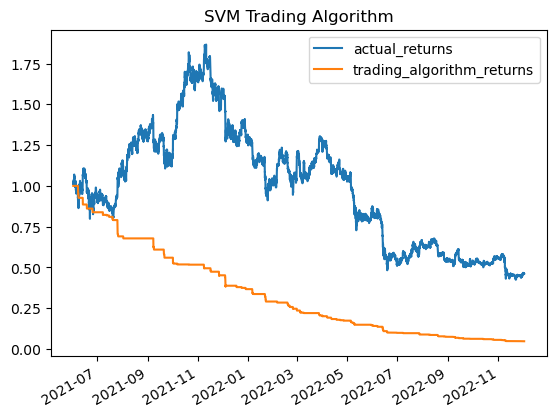

In [58]:
# Calculate and plot the cumulative returns for the `actual_returns` and the `trading_algorithm_returns`
(1 + predictions_df[["actual_returns", "trading_algorithm_returns"]]).cumprod().plot(title = "SVM Trading Algorithm")

### Add a Logistic Regression Model

In [59]:
# Create an instance of the LogisticRegression model
logistic_regression_model = LogisticRegression()

In [60]:
# Fit the LogisticRegression model
logistic_regression_model.fit(X_train_scaled, y_train)

LogisticRegression()

In [61]:
# Use the trained LogisticRegression model to predict the trading signals for the training data
lr_training_signal_predictions = logistic_regression_model.predict(X_train_scaled)

# Display the predictions
lr_training_signal_predictions

array([-1., -1.,  0., ...,  0.,  0.,  0.])

In [62]:
# Generate a classification report using the training data and the logistic regression model's predications
lr_training_report = classification_report(y_train, lr_training_signal_predictions)

# Review the classification report
print(lr_training_report)

              precision    recall  f1-score   support

        -1.0       1.00      0.92      0.96        61
         0.0       1.00      1.00      1.00      4204
         1.0       1.00      0.66      0.79        41

    accuracy                           1.00      4306
   macro avg       1.00      0.86      0.92      4306
weighted avg       1.00      1.00      1.00      4306



In [63]:
# Use the trained model to predict the trading signals for the testing data.
lr_testing_signal_predictions = logistic_regression_model.predict(X_test_scaled)

In [64]:
# Generate a classification report using the testing data and the logistic regression model's predictions
lr_testing_report = classification_report(y_test, lr_testing_signal_predictions)

# Review the testing classification report
print(lr_testing_report)

              precision    recall  f1-score   support

        -1.0       1.00      0.79      0.88       124
         0.0       0.99      1.00      1.00     12486
         1.0       1.00      0.81      0.89       380

    accuracy                           0.99     12990
   macro avg       1.00      0.87      0.92     12990
weighted avg       0.99      0.99      0.99     12990



In [65]:
# Create a new empty predictions DataFrame using code provided below.
lr_predictions_df = pd.DataFrame(index=X_test.index)
lr_predictions_df["predicted_signal"] = lr_testing_signal_predictions
lr_predictions_df["actual_returns"] = btc_df["actual_returns"]
lr_predictions_df["trading_algorithm_returns"] = lr_predictions_df["actual_returns"] * lr_predictions_df["predicted_signal"]
lr_predictions_df.head()

,predicted_signal,actual_returns,trading_algorithm_returns
2021-06-02 07:00:00,0.0,0.012233,0.0
2021-06-02 08:00:00,0.0,0.004740,0.0
2021-06-02 09:00:00,0.0,-0.001743,-0.0
2021-06-02 10:00:00,0.0,-0.004271,-0.0
2021-06-02 11:00:00,0.0,0.000533,0.0


<AxesSubplot:title={'center':'Logistic Regression Trading Algorithm'}>

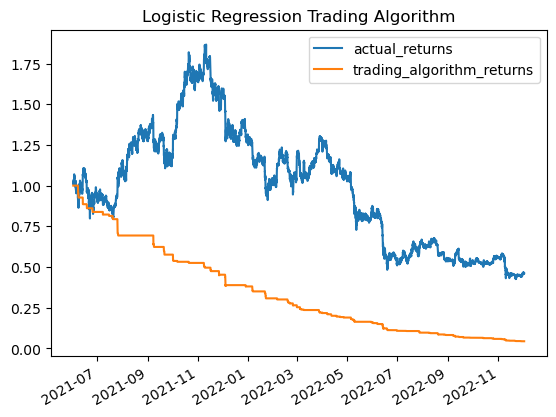

In [66]:
# Calculate and plot the cumulative returns for the `actual_returns` and the `trading_algorithm_returns`
(1 + lr_predictions_df[["actual_returns", "trading_algorithm_returns"]]).cumprod().plot(title = "Logistic Regression Trading Algorithm")

### Add a Logistic Regression Model

In [67]:
#Creating the RandomForestClassifer instance
rf_model = RandomForestClassifier(random_state=1)

# Fit the training data to the model
rf_model = rf_model.fit(X_train_scaled, y_train)

# Predict labels for original scaled testing features
rf_pred = rf_model.predict(X_test_scaled)

In [68]:
# Generate a classification report using the training data and the RandomForestClassifier model's predications
rf_testing_report = classification_report(y_test, rf_pred)

In [69]:
# Print the classification report for the RandomForestClassifier model using the test data
print("RandomForestClassifier Classification Report")
print(rf_testing_report)

RandomForestClassifier Classification Report
              precision    recall  f1-score   support

        -1.0       1.00      0.99      1.00       124
         0.0       1.00      1.00      1.00     12486
         1.0       1.00      0.99      1.00       380

    accuracy                           1.00     12990
   macro avg       1.00      0.99      1.00     12990
weighted avg       1.00      1.00      1.00     12990



In [70]:
# Create a new empty predictions DataFrame using code provided below.
rf_predictions_df = pd.DataFrame(index=X_test.index)
rf_predictions_df["predicted_signal"] = rf_pred
rf_predictions_df["actual_returns"] = btc_df["actual_returns"]
rf_predictions_df["rf_algorithm_returns"] = rf_predictions_df["actual_returns"] * rf_predictions_df["predicted_signal"]

<AxesSubplot:title={'center':'RandomForestClassifier Trading Algorithm'}>

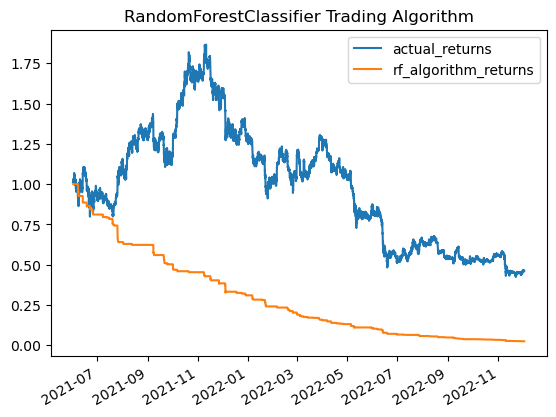

In [71]:
#Plotting the RandomForestClassifier returns compared to the actual returns
(1 + rf_predictions_df[["actual_returns", "rf_algorithm_returns"]]).cumprod().plot(title = "RandomForestClassifier Trading Algorithm")

## Compare the performance of the SVM, Logistic Regression, and RandomForestClassifier  using the classification reports generated with the testing data. 

In [72]:
# Print the classification report for the SVM model using the test data
print("SVM Classification Report")
print(svm_testing_report)

SVM Classification Report
              precision    recall  f1-score   support

        -1.0       0.99      0.84      0.91       124
         0.0       0.99      1.00      1.00     12486
         1.0       1.00      0.75      0.86       380

    accuracy                           0.99     12990
   macro avg       0.99      0.86      0.92     12990
weighted avg       0.99      0.99      0.99     12990



In [73]:
# Print the classification report for the Logistic Regression model using the test data
print("Logistic Regression Classification Report")
print(lr_testing_report)


Logistic Regression Classification Report
              precision    recall  f1-score   support

        -1.0       1.00      0.79      0.88       124
         0.0       0.99      1.00      1.00     12486
         1.0       1.00      0.81      0.89       380

    accuracy                           0.99     12990
   macro avg       1.00      0.87      0.92     12990
weighted avg       0.99      0.99      0.99     12990



In [74]:
# Print the classification report for the RandomForestClassifier model using the test data
print("RandomForestClassifier Classification Report")
print(rf_testing_report)

RandomForestClassifier Classification Report
              precision    recall  f1-score   support

        -1.0       1.00      0.99      1.00       124
         0.0       1.00      1.00      1.00     12486
         1.0       1.00      0.99      1.00       380

    accuracy                           1.00     12990
   macro avg       1.00      0.99      1.00     12990
weighted avg       1.00      1.00      1.00     12990



## Predicting Signals with Neural Network



In [75]:
#Defining the number of inputs for the model
number_inputs = 3

#Define the number of nodes for the first hidden layer
hidden_nodes_layer1 = 10

#Define the number of nodes for the second hidden layer
hidden_nodes_layer2 = 8

In [76]:
#Initialising the Sequential model
nn_model = Sequential()

2022-12-02 15:38:02.308693: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [77]:
# Add the first Dense layer specifying the number of inputs, the number of hidden nodes, and the activation function
nn_model.add(
    Dense(units=hidden_nodes_layer1, input_dim=number_inputs, activation="relu")
)

# Add the second Dense layer specifying the number of hidden nodes and the activation function
nn_model.add(
    Dense(units=hidden_nodes_layer2, activation="relu")
)

# Add the output layer to the model specifying the number of output neurons and activation function
nn_model.add(Dense(units=1, activation="sigmoid"))

In [78]:
# Display the Sequential model summary
nn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 10)                40        
                                                                 
 dense_1 (Dense)             (None, 8)                 88        
                                                                 
 dense_2 (Dense)             (None, 1)                 9         
                                                                 
Total params: 137
Trainable params: 137
Non-trainable params: 0
_________________________________________________________________


In [79]:
# Compile the Sequential model
nn_model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [80]:
# Fit the model using 100 epochs and the training data
nn_model.fit(X_train_scaled, y_train, epochs=100)

Epoch 1/100
135/135 [==============================] - 1s 1ms/step - loss: 0.5727 - accuracy: 0.7838
Epoch 2/100
135/135 [==============================] - 0s 1ms/step - loss: 0.1777 - accuracy: 0.9763
Epoch 3/100
135/135 [==============================] - 0s 961us/step - loss: -0.0042 - accuracy: 0.9763
Epoch 4/100
135/135 [==============================] - 0s 947us/step - loss: -0.1123 - accuracy: 0.9763
Epoch 5/100
135/135 [==============================] - 0s 974us/step - loss: -0.2427 - accuracy: 0.9763
Epoch 6/100
135/135 [==============================] - 0s 1ms/step - loss: -0.4413 - accuracy: 0.9763
Epoch 7/100
135/135 [==============================] - 0s 971us/step - loss: -0.7378 - accuracy: 0.9763
Epoch 8/100
135/135 [==============================] - 0s 969us/step - loss: -1.1695 - accuracy: 0.9763
Epoch 9/100
135/135 [==============================] - 0s 953us/step - loss: -1.7734 - accuracy: 0.9763
Epoch 10/100
135/135 [==============================] - 0s 965us/step - 

In [81]:
# Evaluate the model loss and accuracy metrics using the evaluate method and the test data
model_loss, model_accuracy = nn_model.evaluate(X_test_scaled, y_test, verbose=2)

# Display the evaluation results
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

406/406 - 0s - loss: -1.1221e+03 - accuracy: 0.9901 - 400ms/epoch - 985us/step
Loss: -1122.0950927734375, Accuracy: 0.9900692701339722


In [82]:
nn_pred = nn_model.predict(X_test_scaled)
nn_pred

406/406 [==============================] - 0s 694us/step


array([[0.],
       [0.],
       [0.],
       ...,
       [0.],
       [0.],
       [0.]], dtype=float32)

In [83]:
nn_predictions_df = pd.DataFrame(index=X_test.index)
nn_predictions_df["predicted_signal"] = nn_pred
nn_predictions_df["actual_returns"] = btc_df["actual_returns"]
nn_predictions_df["neural_network_algorithm_returns"] = nn_predictions_df["actual_returns"] * nn_predictions_df["predicted_signal"]

<AxesSubplot:title={'center':'Neural Network Trading Algorithm'}>

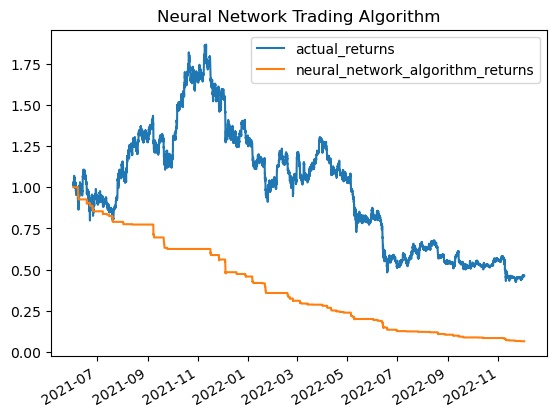

In [84]:
(1 + nn_predictions_df[["actual_returns", "neural_network_algorithm_returns"]]).cumprod().plot(title = "Neural Network Trading Algorithm")

The machine learning results indicate that all machine learning modules and neural networks performed well at predicting RSI buy and sell signals using RSI, BTC price, and volume data as features. The SVM and Logistic Regression modules scored a recall (ratio of correct positive predictions to the total positives examples) metric above 75%, whereas, the Random Forest Classifier module displayed the best results all round scoring 99%. Likewise, the neural network performed admirably with an accuracy of 99%. However, despite these high degrees in accuracy scores for predicting buy and sells signals we saw all machine learning portfolio lose more money when compared to a buy and hold strategy. It is difficult to definitively explain why this is the case, however, there are several factors that are likely to have contributed to these lacklustre results.   

The first and mostly likely explanation is that the RSI signals were not well suited for the high degree of volatility seen in the cryptomarket. The RSI strategy did give the best result of 10.16% profit during the back testing phase of the experiment when compared to the other trading strategies. However, this level of profit does not permit a high degree of flexibility or repetition. Additionally, back testing results of different time lengths (1 year vs 2 years) showed less profit with the RSI strategy (data not shown). Secondly, the length of training given to the machine learning algorithms did not incorporate all the large swings in price data seen in recent months. Therefore, it could be suggested that the machine learning modules did well at learning when to buy and sell based of the feature set given, however, the feature set was inadequate for turning a profit in such a volatile market space.    

Based on these results incorporating a machine learning algorithm into a quantitative trading strategy could be beneficial, however, careful consideration must be given to the feature sets to be successful. Likewise, better preparation of data is also advised. Nevertheless, our findings suggest that the Random Forest Classifier was a clear front runner for this type of application among the machine learning modules chosen for this experiment. This is unsurprising as the Random Forest Classifier is often used in banking and market sectors due to being well suited for making predictions while able to mitigate the possibility of becoming overtrained to particular data sets
